# Exploratory Data Analysis

## Import Libraries 

In [2]:
# Load library:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import seaborn as sns
import pandas as pd
import os
# import missingno as msnao 
import math
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler, StandardScaler

In [3]:
df = pd.read_csv("clean.csv")

## Statistical Analysis

In [4]:
df.describe()

,Unnamed: 0,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height in Cms,Weight in Pounds,Value in Pounds,Wage in Pounds
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,...,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,1.820700e+04,18207.000000
mean,9103.000000,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,...,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887,181.261861,165.976547,2.410696e+06,9731.312133
std,5256.052511,4.669943,6.908930,6.136496,272.586016,0.393511,0.659585,0.755167,15.921465,18.340299,...,21.261052,17.672007,16.884598,16.481095,17.012198,17.931434,6.721782,15.572856,5.594933e+06,21999.290406
min,0.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,154.940000,110.000000,0.000000e+00,0.000000
25%,4551.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,...,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,175.260000,154.000000,3.000000e+05,1000.000000
50%,9103.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,...,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,180.340000,165.000000,6.750000e+05,3000.000000
75%,13654.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,...,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,185.420000,176.000000,2.000000e+06,9000.000000
max,18206.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,...,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000,205.740000,243.000000,1.185000e+08,565000.000000


In [5]:
# Check type of predictor feature
print('Name and type of varialbes are: \n')
print(df.dtypes)
print('\nThe number of variables is %d' %len(df.columns))
print('...The number of categorical variables is %d' %(df.shape[1] - sum(df.dtypes=='float64') - sum(df.dtypes=='int64'))) # <- Count object type (Categorical variable) 
print('...The number of continuous variable is %d' %(sum(df.dtypes=='float64') + sum(df.dtypes=='int64'))) # <- Count float type (Continuos variable)

list_predictor_continuous = []
list_predictor_categorical = []

for name in df.columns[3:]:
    if df[name].dtype == 'float64' or df[name].dtype == 'int64':
        list_predictor_continuous.append(name)
    else:
        list_predictor_categorical.append(name)

print('List of continuous predictor:')
print(list_predictor_continuous)
print('List of categorical predictor:')
print(list_predictor_categorical)

Name and type of varialbes are: 

Unnamed: 0            int64
Name                 object
Age                   int64
Nationality          object
Overall               int64
                     ...   
Release Clause       object
Height in Cms       float64
Weight in Pounds      int64
Value in Pounds     float64
Wage in Pounds      float64
Length: 85, dtype: object

The number of variables is 85
...The number of categorical variables is 38
...The number of continuous variable is 47
List of continuous predictor:
['Overall', 'Potential', 'Special', 'International Reputation', 'Weak Foot', 'Skill Moves', 'Jersey Number', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 

## Visualizations

/Users/sanyas/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


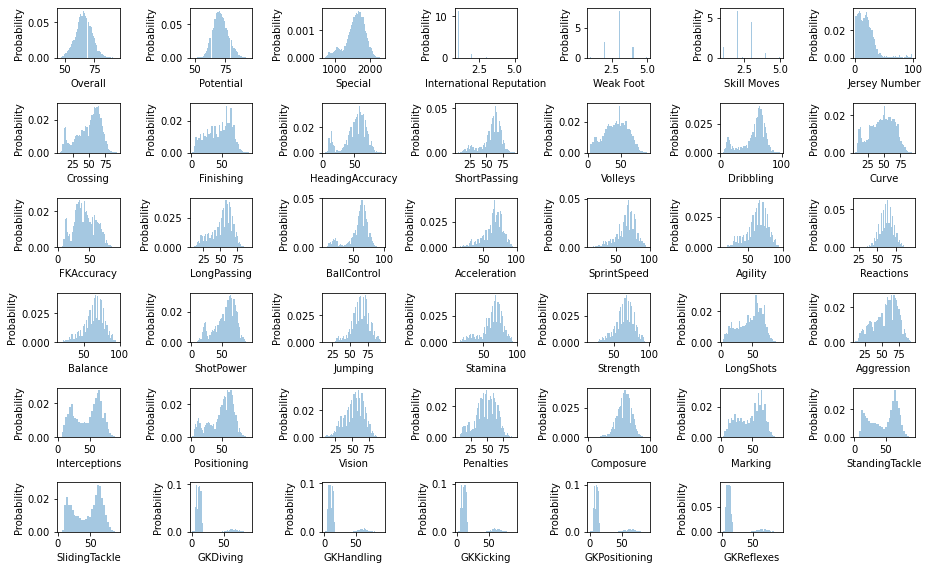

In [6]:
# Marginal distributions of variables: https://seaborn.pydata.org/generated/seaborn.distplot.html
plt.figure(figsize = (13,8))
for i, name in enumerate(list_predictor_continuous):
    plt.subplot(6,7,i+1);
    sns.distplot(df.loc[:,name], kde = False, norm_hist = True)
    plt.ylabel('Probability')
plt.tight_layout()

This shows the probability of different continious values in the dataset, including the target variable. We can see that even if some variables correlated well with our Overall target variable, the probability of it appearing would be smaller and would not be a good variable to use, even if imputated. 

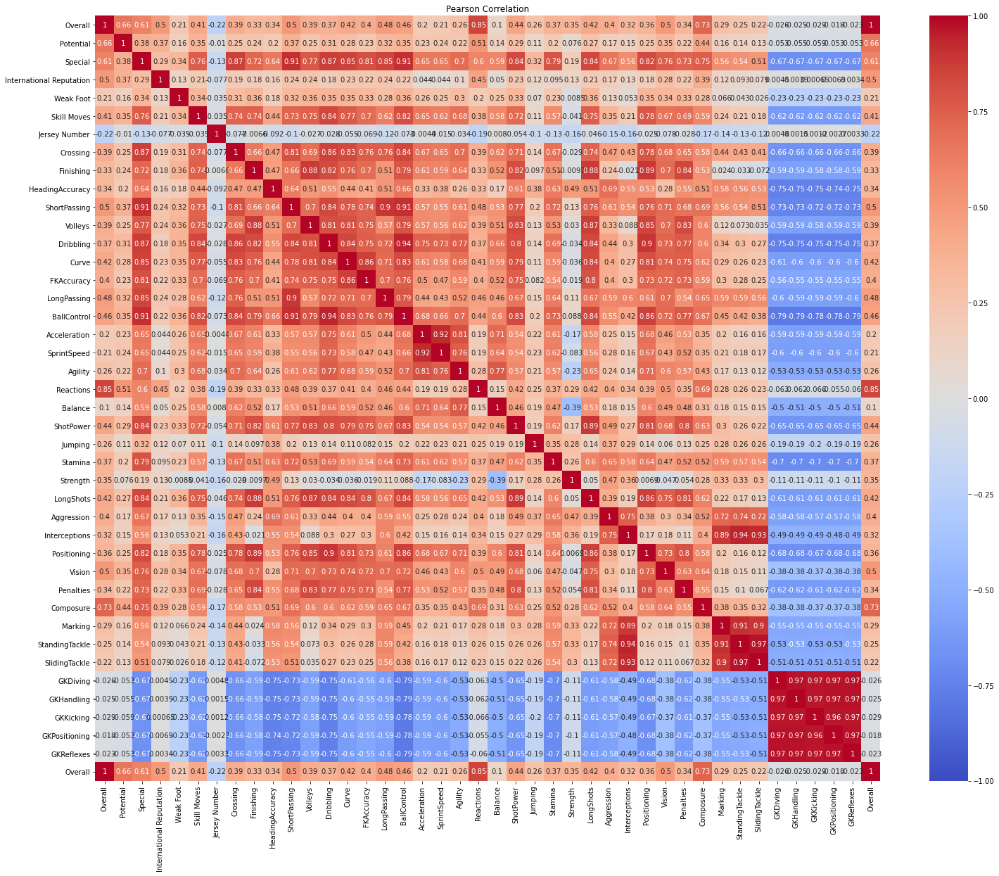

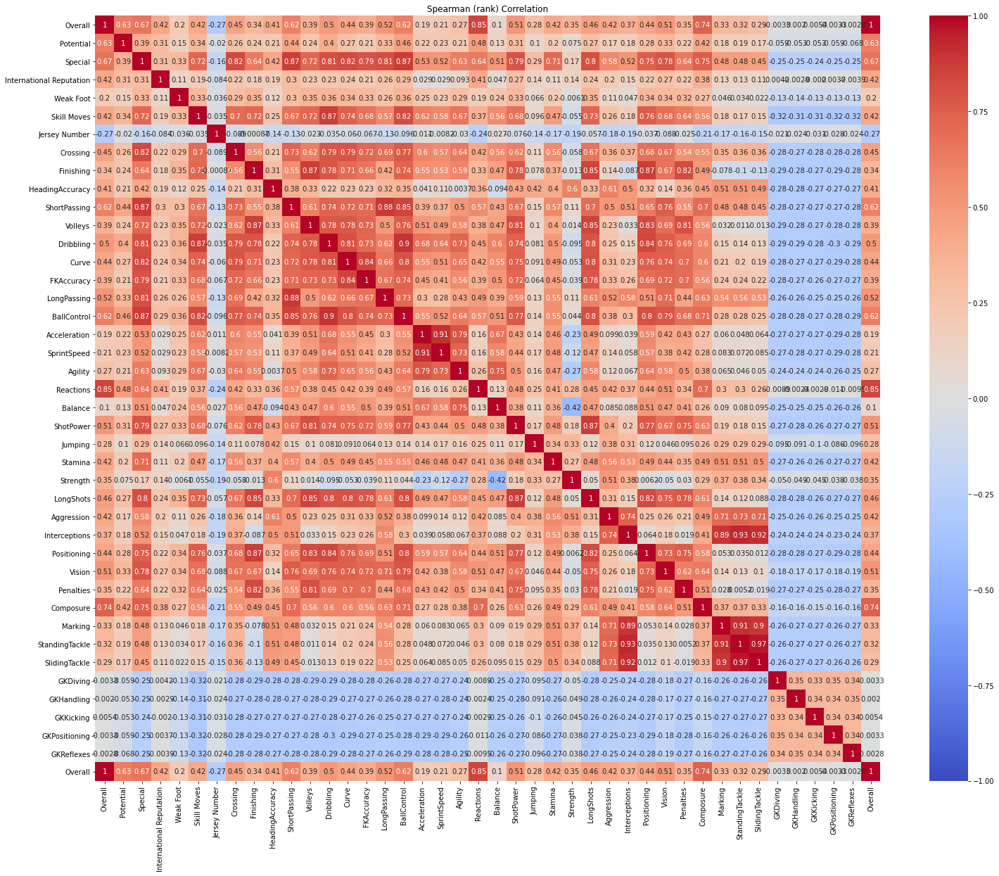

In [7]:
# Correlation Coefficient Matrix (https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.corr.html)
list_ = list_predictor_continuous.copy(); list_.append('Overall')
plt.figure(figsize = (25,20))
plt.title('Pearson Correlation')
sns.heatmap(df.loc[:,list_].corr(method='pearson'), vmin=-1, vmax = 1, cmap='coolwarm', annot=True);

plt.figure(figsize = (25,20))
plt.title('Spearman (rank) Correlation')
sns.heatmap(df.loc[:,list_].corr(method='spearman'), vmin=-1, vmax = 1, cmap='coolwarm', annot=True);

This is one way of conducting EDA and feature selection. We see the overall correlation of variables between each other with Spearman and Person correlation. The stronger correlations with the target variable of Overall is most likely to be the features used in our predictive model. 

## Box Plots

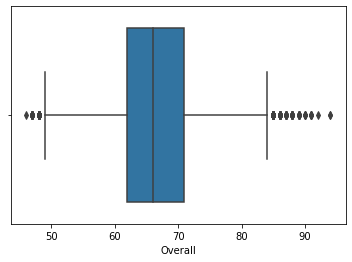

In [8]:
sns.boxplot(x=df['Overall'])

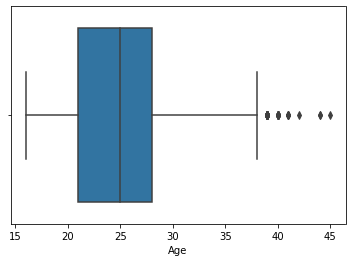

In [9]:
sns.boxplot(x=df['Age'])

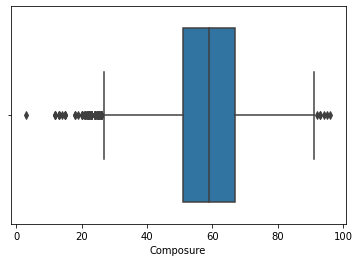

In [10]:
sns.boxplot(x=df['Composure'])

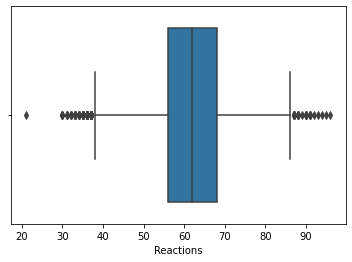

In [11]:
sns.boxplot(x=df['Reactions'])

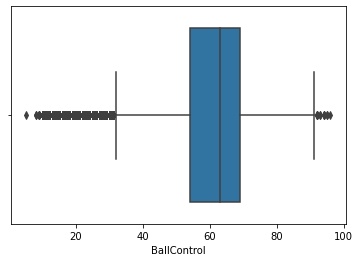

In [12]:
sns.boxplot(x=df['BallControl'])

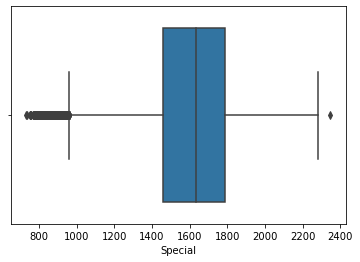

In [13]:
sns.boxplot(x=df['Special'])

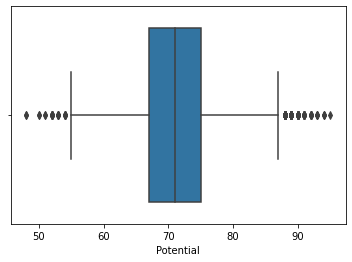

In [14]:
sns.boxplot(x=df['Potential'])

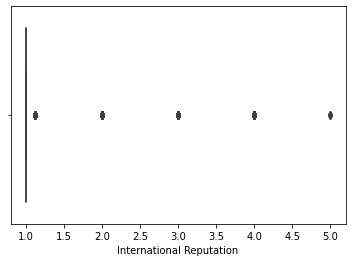

In [15]:
sns.boxplot(x=df['International Reputation'])

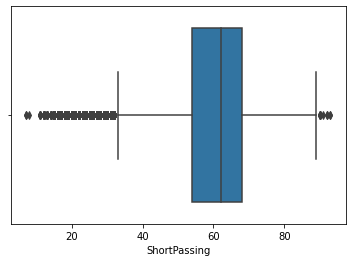

In [16]:
sns.boxplot(x=df['ShortPassing'])

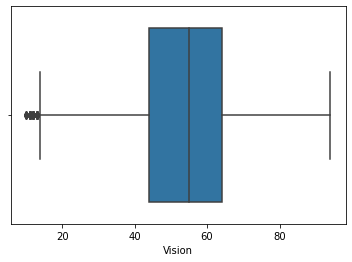

In [17]:
sns.boxplot(x=df['Vision'])

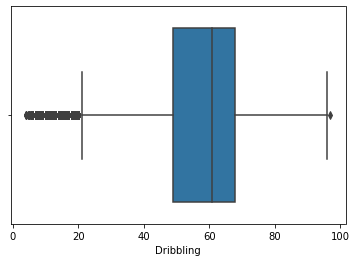

In [18]:
sns.boxplot(x=df['Dribbling'])

We looked at each of the strongest variables that are correlated with the Target Variable of Overall. The more outliers and skewed the boxplot is, the worse it would be to use that feature in our model. Giving us more intuition on what features would be the best to use. 

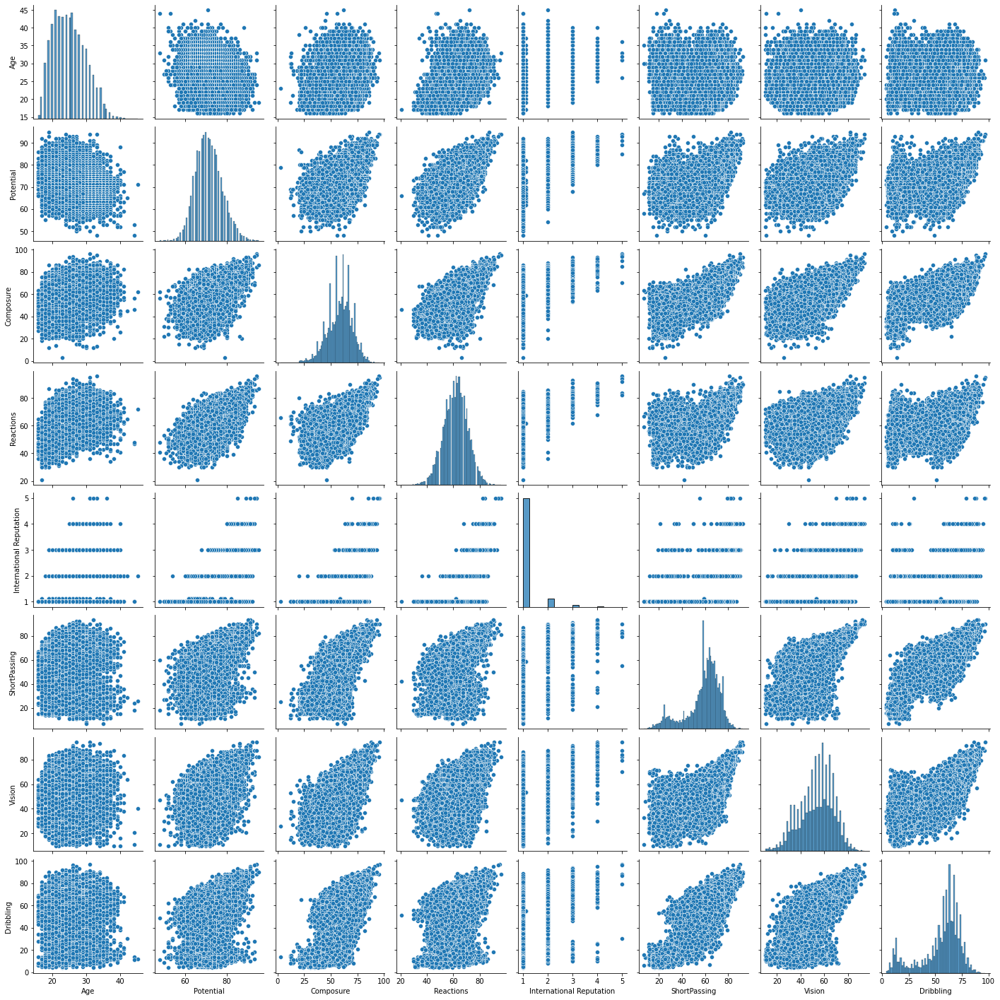

In [19]:
#plot the pair plot of salary, balance and age in data dataframe.
sns.pairplot(data = df, vars=['Age','Potential', 'Composure', 'Reactions', 'International Reputation', 'ShortPassing', 'Vision','Dribbling'])
plt.show()

In [21]:
import plotly.graph_objects as go

import pandas as pd


fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = df['Overall'],
                   colorscale = [[0,'purple'],[0.5,'lightseagreen'],[1,'gold']]),
        dimensions = list([
            dict(range = [0,100],
                constraintrange = [4,8],
                label = 'Composure', values = df['Composure']),
            dict(range = [0,100],
                label = 'Reactions', values = df['Reactions']),
            dict(range = [0,5],
                label = 'Int. Rep.', values = df['International Reputation']),
            dict(range = [0,100],
                label = 'Vision', values = df['Vision']),
            dict(range = [0,100],
                label = 'Potential', values = df['Potential']),
            dict(range = [0,100],
                label = 'Dribbling', values = df['Dribbling']),
            dict(range = [0,100],
                label = 'Ball Control', values = df['BallControl']),
            dict(range = [700,2400],
                label = 'Special', values = df['Special']),
            dict(range = [15,50],
                label = 'Age', values = df['Age'])
            
        ])
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

In [22]:
import plotly.express as px
fig = px.scatter_3d(df, x='Reactions', y='Composure', z='Overall', 
                    size_max=18, opacity=0.7)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

In [23]:
import plotly.express as px
fig = px.scatter_3d(df, x='ShortPassing', y='Composure', z='Overall', 
                    size_max=18, opacity=0.7)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

## Nationality Map

In [24]:
import pycountry 
def alpha3code(column):
    CODE=[]
    for country in column:
        try:
            code=pycountry.countries.get(name=country).alpha_3
           # .alpha_3 means 3-letter country code 
           # .alpha_2 means 2-letter country code
            CODE.append(code)
        except:
            CODE.append('None')
    return CODE
# create a column for code 
df['CODE']=alpha3code(df.Nationality)
df.head()

,Unnamed: 0,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,CODE
0,0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,2202,...,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M,ARG
1,1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,2228,...,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M,PRT
2,2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,2143,...,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M,BRA
3,3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,1471,...,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M,ESP
4,4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,2281,...,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M,BEL


In [25]:
import geopandas

In [26]:
# first let us merge geopandas data with our data
# 'naturalearth_lowres' is geopandas datasets so we can use it directly
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
# rename the columns so that we can merge with our data]
world.columns=['pop_est', 'continent', 'name','CODE', 'gdp_md_est', 'geometry']
# then merge with our data 
merge=pd.merge(world,df,on='CODE')

In [27]:
merge.head()

,pop_est,continent,name,CODE,gdp_md_est,geometry,Unnamed: 0,Name,Age,Nationality,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",4083,R. Krishna,30,Fiji,...,63.0,42.0,48.0,43.0,13.0,13.0,6.0,11.0,9.0,€2.9M
1,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",2003,C. Larin,23,Canada,...,64.0,21.0,18.0,20.0,12.0,9.0,8.0,12.0,7.0,€20M
2,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",2107,J. Hoilett,28,Canada,...,66.0,20.0,39.0,28.0,11.0,10.0,9.0,11.0,9.0,€11M
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",2276,L. Cavallini,25,Canada,...,69.0,35.0,29.0,13.0,10.0,11.0,6.0,7.0,15.0,€12.4M
4,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",2862,S. Arfield,29,Canada,...,80.0,61.0,64.0,62.0,13.0,13.0,9.0,13.0,16.0,€6.9M


In [28]:
location=pd.read_csv('countries.csv')
merge=merge.merge(location,on='name').sort_values(by='Overall',ascending=False).reset_index()

In [29]:
import plotly.express as px
fig = px.scatter_mapbox(merge,
                        lat='latitude',
                        lon='longitude',
                        hover_name='Nationality',
                        color="Overall",
                        zoom=10.5,
                        hover_data=['Overall','ShortPassing','Composure','Reactions', 'Dribbling','BallControl'],
                        height=500)


fig.update_layout(mapbox_style="carto-darkmatter")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

## Categorical Variables
### Cat Codes conversion

In [32]:
df.Position = pd.Categorical(df.Position)
df['pos_code'] = df.Position.cat.codes

In [56]:
b = pd.Series(df['Body Type']).astype('category') 

In [57]:
df['BT_code'] = b.cat.codes

In [43]:
s = pd.Series(df['WR']).astype('category') 

In [45]:
df['WR_code'] = s.cat.codes

### Position with Higher Overalls

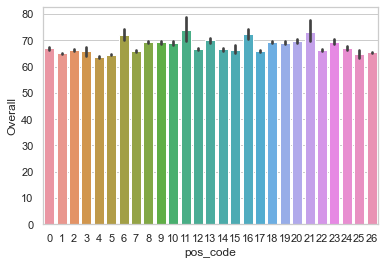

In [33]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="pos_code", y="Overall", data=df)

In [36]:
dict(enumerate(df['Position'].cat.categories ) )

{0: 'CAM',
 1: 'CB',
 2: 'CDM',
 3: 'CF',
 4: 'CM',
 5: 'GK',
 6: 'LAM',
 7: 'LB',
 8: 'LCB',
 9: 'LCM',
 10: 'LDM',
 11: 'LF',
 12: 'LM',
 13: 'LS',
 14: 'LW',
 15: 'LWB',
 16: 'RAM',
 17: 'RB',
 18: 'RCB',
 19: 'RCM',
 20: 'RDM',
 21: 'RF',
 22: 'RM',
 23: 'RS',
 24: 'RW',
 25: 'RWB',
 26: 'ST'}

### Work Rate with highest Overalls

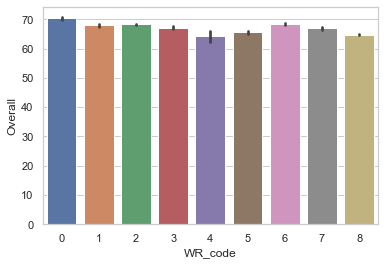

In [46]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="WR_code", y="Overall", data=df)

In [48]:
dict(enumerate(s.cat.categories ) )

{0: 'High/ High',
 1: 'High/ Low',
 2: 'High/ Medium',
 3: 'Low/ High',
 4: 'Low/ Low',
 5: 'Low/ Medium',
 6: 'Medium/ High',
 7: 'Medium/ Low',
 8: 'Medium/ Medium'}

### Body Type with Higher Overall

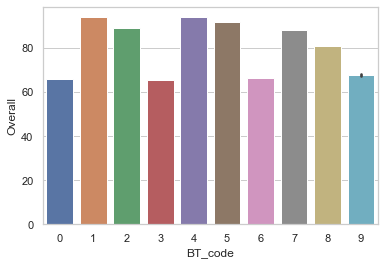

In [58]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="BT_code", y="Overall", data=df)

In [59]:
dict(enumerate(b.cat.categories ) )

{0: 'Akinfenwa',
 1: 'C. Ronaldo',
 2: 'Courtois',
 3: 'Lean',
 4: 'Messi',
 5: 'Neymar',
 6: 'Normal',
 7: 'PLAYER_BODY_TYPE_25',
 8: 'Shaqiri',
 9: 'Stocky'}

### Real Face with Higher Overall

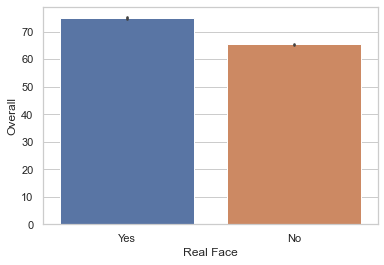

In [69]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="Real Face", y="Overall", data=df)

These are the categorical values with higher overalls based on th shortest unique values. We can see body type and real face seems to have the most impact on overall. Thee influence will be determined with feature engineering. 